# Распознавание номеров

In [ ]:
import zipfile    #библиотека для работы с zip архивом
import os         #библиотека для работы с файловой системов
import time       #библиотека для работы со временем
from PIL import Image          #модуль Image для работы с изображениями
import torch

In [ ]:
from google.colab import drive #подключение к гугл диску
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [ ]:
!unzip ./drive/MyDrive/data.zip

Streaming output truncated to the last 5000 lines.
  inflating: data/val/images/22372.jpg  
  inflating: __MACOSX/data/val/images/._22372.jpg  
  inflating: data/val/images/22414.jpg  
  inflating: __MACOSX/data/val/images/._22414.jpg  
  inflating: data/val/images/24065.jpg  
  inflating: __MACOSX/data/val/images/._24065.jpg  
  inflating: data/val/images/24183.bmp  
  inflating: __MACOSX/data/val/images/._24183.bmp  
  inflating: data/val/images/25353.jpg  
  inflating: __MACOSX/data/val/images/._25353.jpg  
  inflating: data/val/images/23834.bmp  
  inflating: __MACOSX/data/val/images/._23834.bmp  
  inflating: data/val/images/25435.jpg  
  inflating: __MACOSX/data/val/images/._25435.jpg  
  inflating: data/val/images/23050.jpg  
  inflating: __MACOSX/data/val/images/._23050.jpg  
  inflating: data/val/images/24197.bmp  
  inflating: __MACOSX/data/val/images/._24197.bmp  
  inflating: data/val/images/25347.jpg  
  inflating: __MACOSX/data/val/images/._25347.jpg  
  inflating: data/v

In [ ]:
!pwd

/content


## Работа с YoloV5

In [ ]:
!git clone https://github.com/ultralytics/yolov5 #клонирование yolov5 в проект
%cd yolov5
!pip install -r requirements.txt

Cloning into 'yolov5'...
remote: Enumerating objects: 14740, done.
remote: Counting objects: 100% (85/85), done.
remote: Compressing objects: 100% (47/47), done.
remote: Total 14740 (delta 53), reused 66 (delta 38), pack-reused 14655
Receiving objects: 100% (14740/14740), 13.77 MiB | 22.78 MiB/s, done.
Resolving deltas: 100% (10143/10143), done.
/content/yolov5
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 182 kB 4.2 MB/s 
     |████████████████████████████████| 62 kB 1.3 MB/s 
     |████████████████████████████████| 1.6 MB 47.3 MB/s 


In [ ]:
!pwd

/content/yolov5


In [ ]:
!python train.py --img 416 --batch 8 --epochs 60 --data coco128.yaml --weights yolov5s.pt --project /content/drive/MyDrive/car_plates  --cache

train: weights=yolov5s.pt, cfg=, data=coco128.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=60, batch_size=8, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=/content/drive/MyDrive/car_plates, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v7.0-42-g5545ff3 Python-3.8.16 torch-1.13.0+cu116 CUDA:0 (Tesla T4, 15110MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hsv_h=0.015, h

In [ ]:
%load_ext tensorboard
%tensorboard --logdir /content/drive/MyDrive/car_plates/exp

<IPython.core.display.Javascript object>

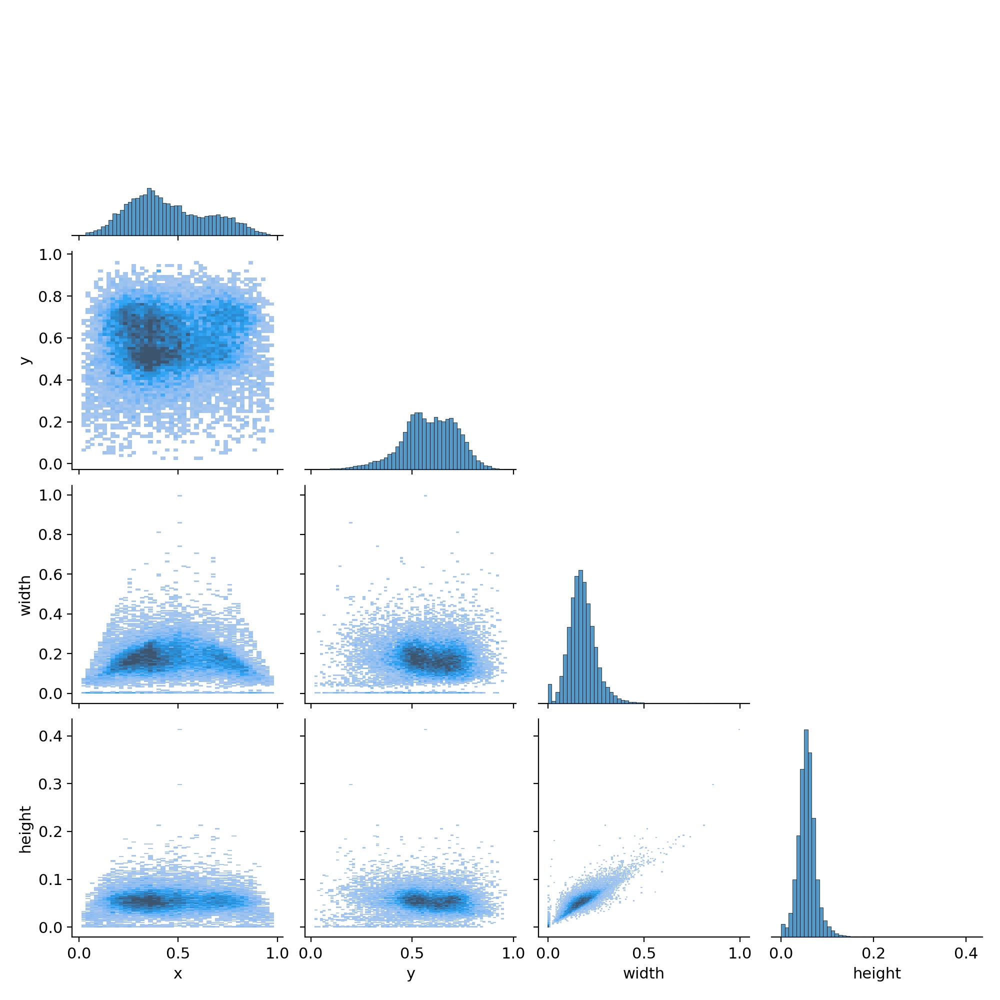

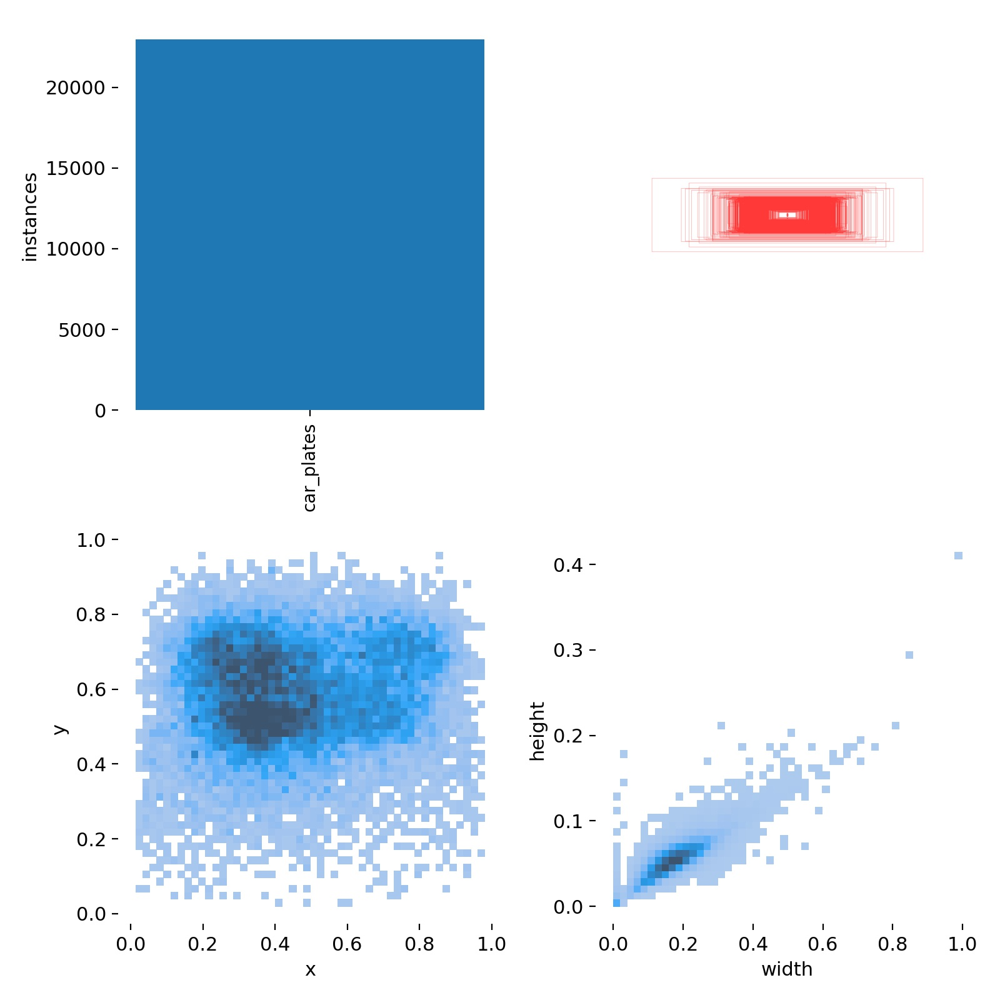

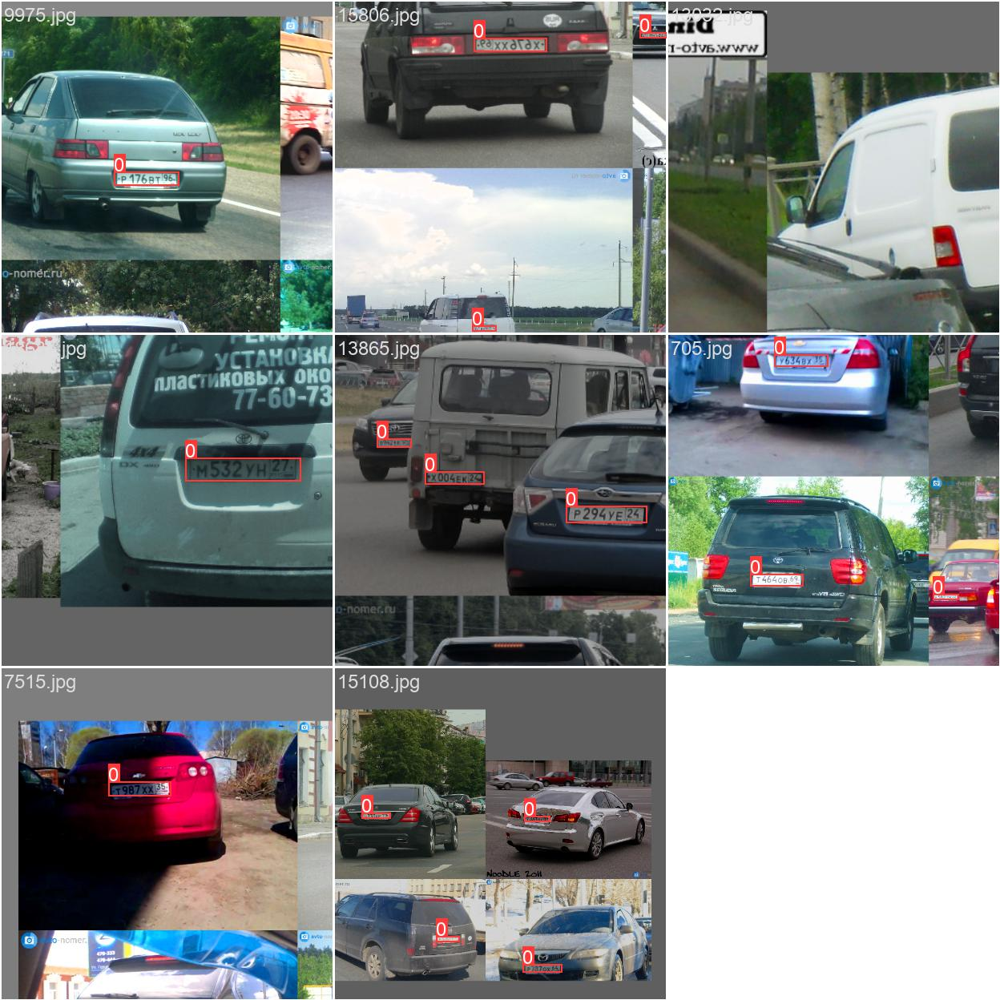

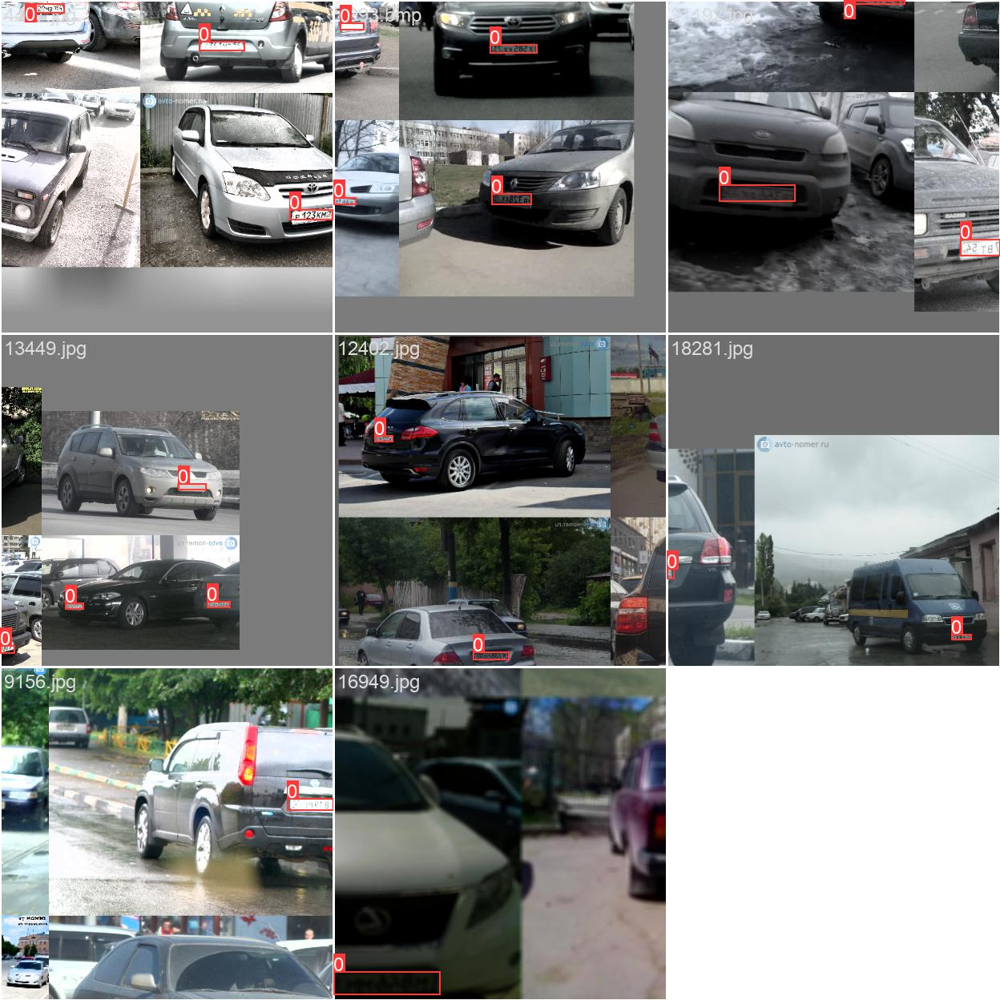

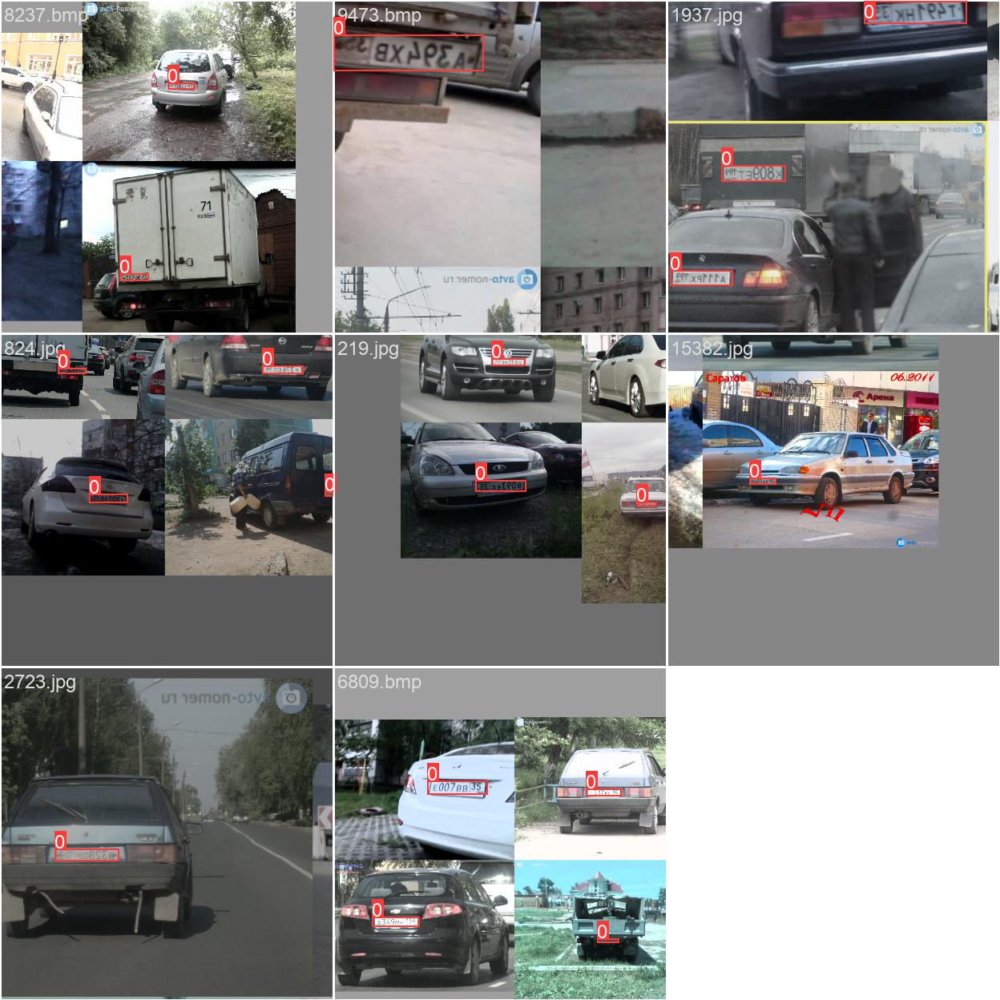

...

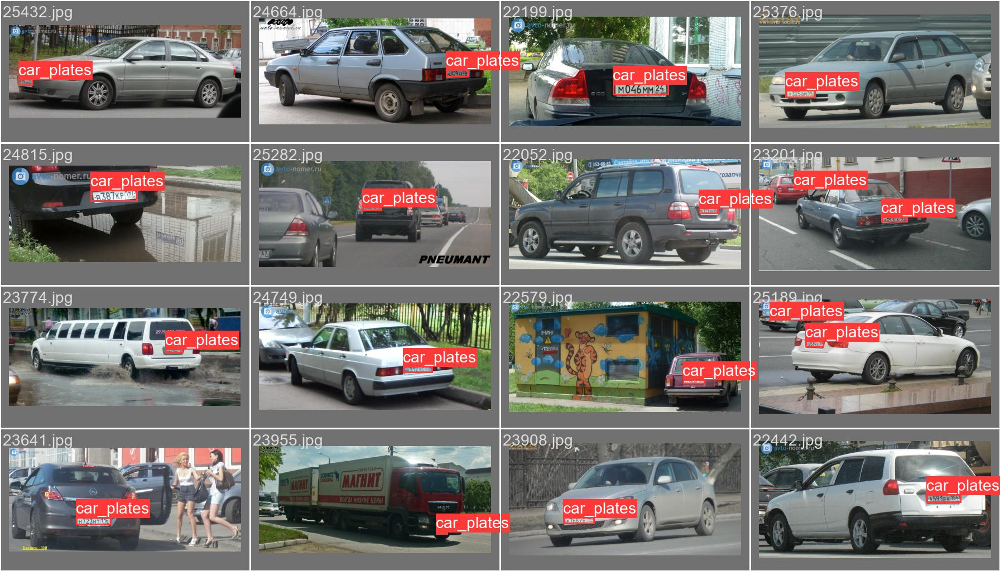

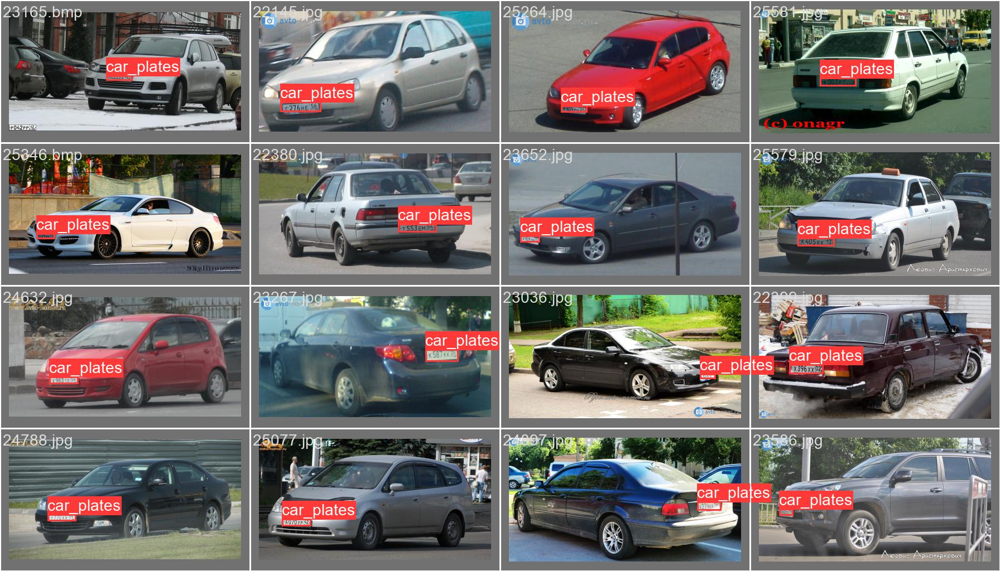

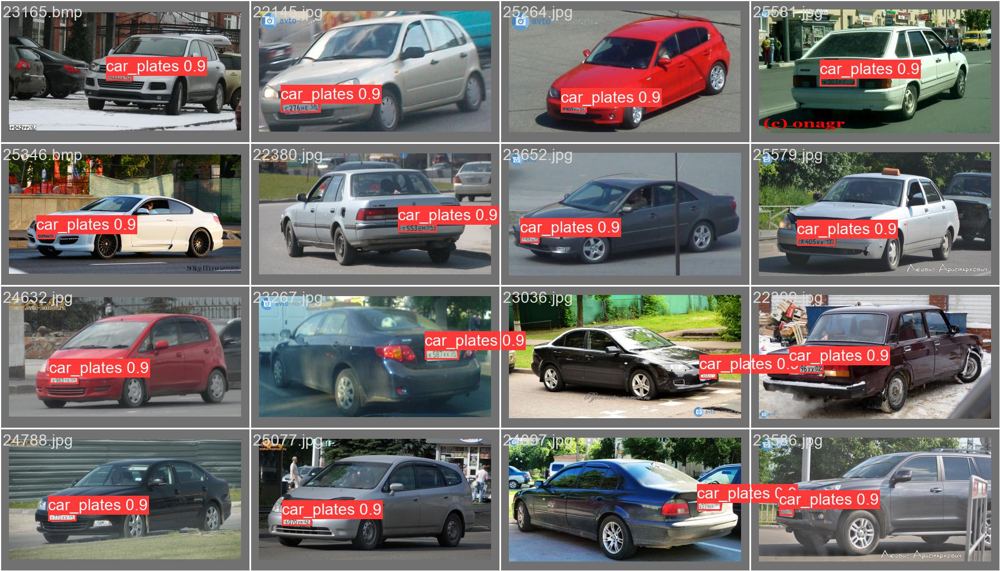

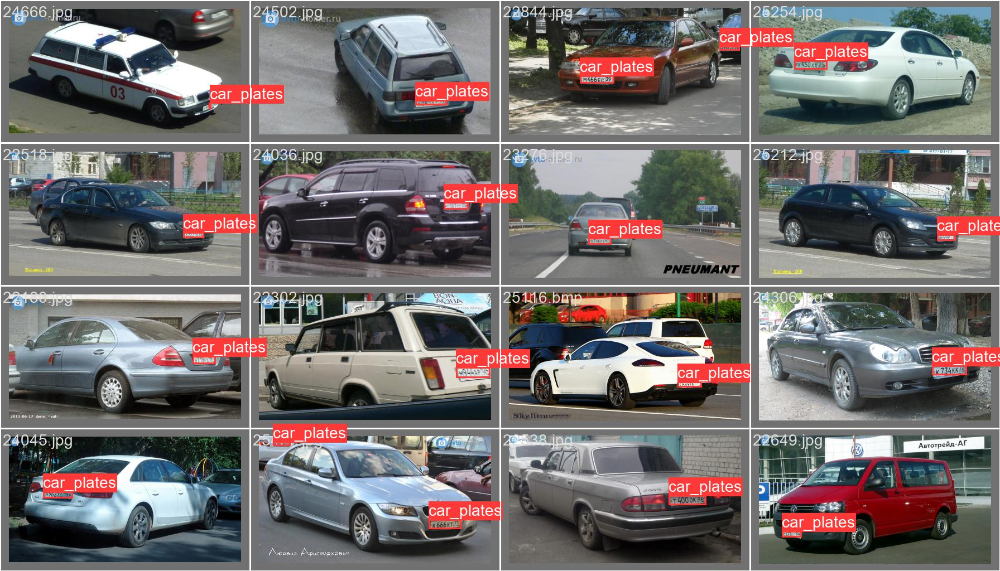

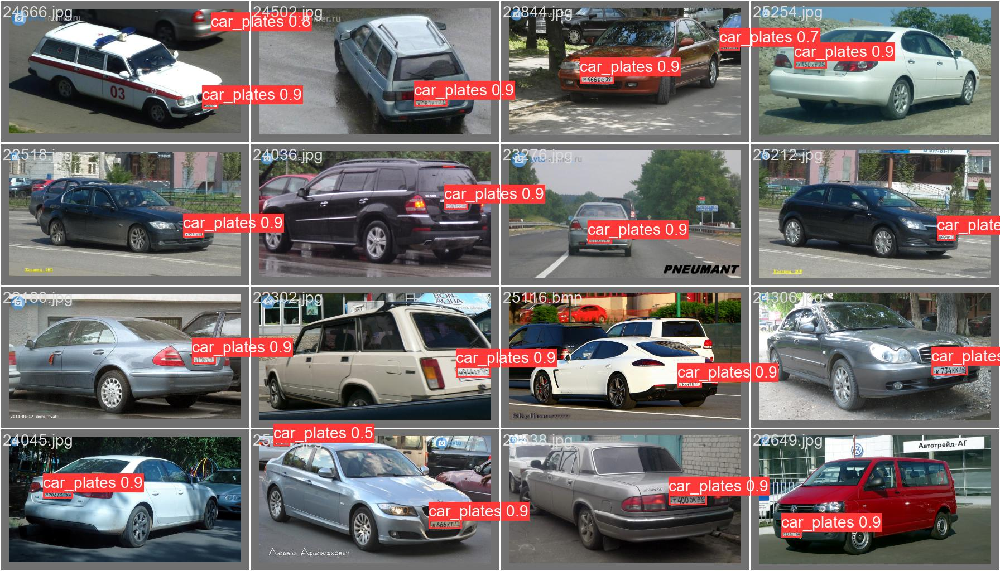

In [ ]:
import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/drive/MyDrive/car_plates/exp/*.jpg'):
    display(Image(filename=imageName))
    print("\n")

In [ ]:
!python detect.py --weights /content/drive/MyDrive/car_plates/exp/weights/best.pt --source /content/drive/MyDrive/car_video.mp4 --project /content/drive/MyDrive/car_plates

detect: weights=['/content/drive/MyDrive/car_plates/exp/weights/best.pt'], source=/content/drive/MyDrive/car_video.mp4, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=/content/drive/MyDrive/car_plates, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-42-g5545ff3 Python-3.8.16 torch-1.13.0+cu116 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model summary: 157 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
video 1/1 (1/450) /content/drive/MyDrive/car_video.mp4: 384x640 (no detections), 13.2ms
video 1/1 (2/450) /content/drive/MyDrive/car_video.mp4: 384x640 (no detections), 8.5ms
video 1/1 (3/450) /content/drive/MyDrive/car_video.mp4: 384x640 (no detections), 8.5ms
video 1/1 (4/450) /cont

In [ ]:
!pwd

/content/yolov5


In [ ]:
!python detect.py --weights /content/drive/MyDrive/car_plates/exp/weights/best.pt --img 416 --conf 0.5 --source /content/data/test/images --project /content/drive/MyDrive/car_plates

detect: weights=['/content/drive/MyDrive/car_plates/exp/weights/best.pt'], source=/content/data/test/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.5, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=/content/drive/MyDrive/car_plates, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-42-g5545ff3 Python-3.8.16 torch-1.13.0+cu116 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model summary: 157 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
image 1/3157 /content/data/test/images/0.jpg: 320x416 1 car_plates, 13.2ms
image 2/3157 /content/data/test/images/1.jpg: 288x416 2 car_platess, 12.1ms
image 3/3157 /content/data/test/images/10.jpg: 288x416 1 car_plates, 8.2ms
image 4/3157 /content/data/test/images/100.jpg: 256x416 1 car_plates, 1

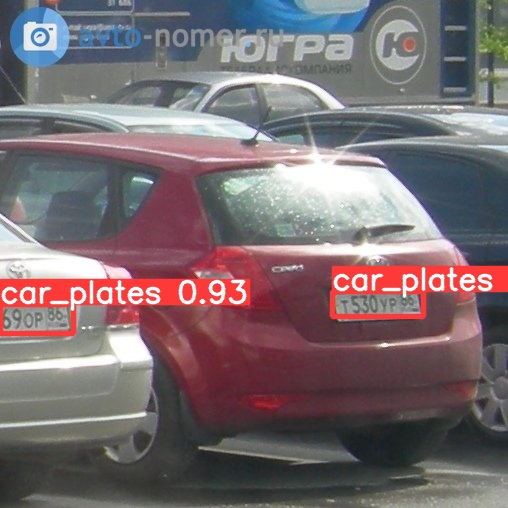

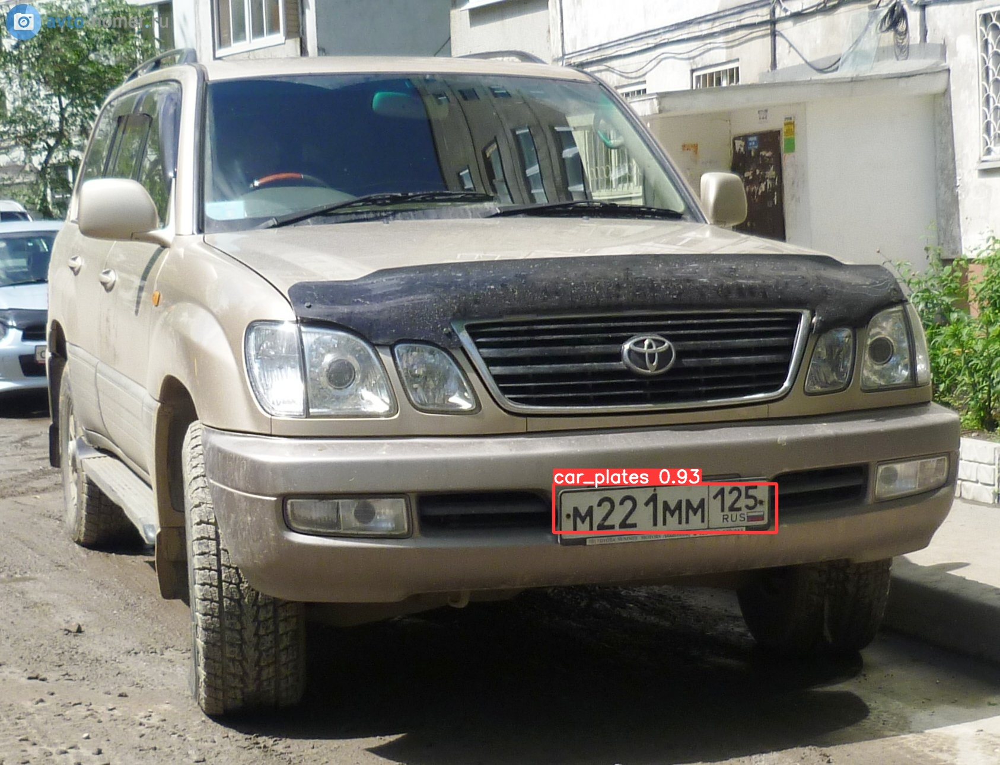

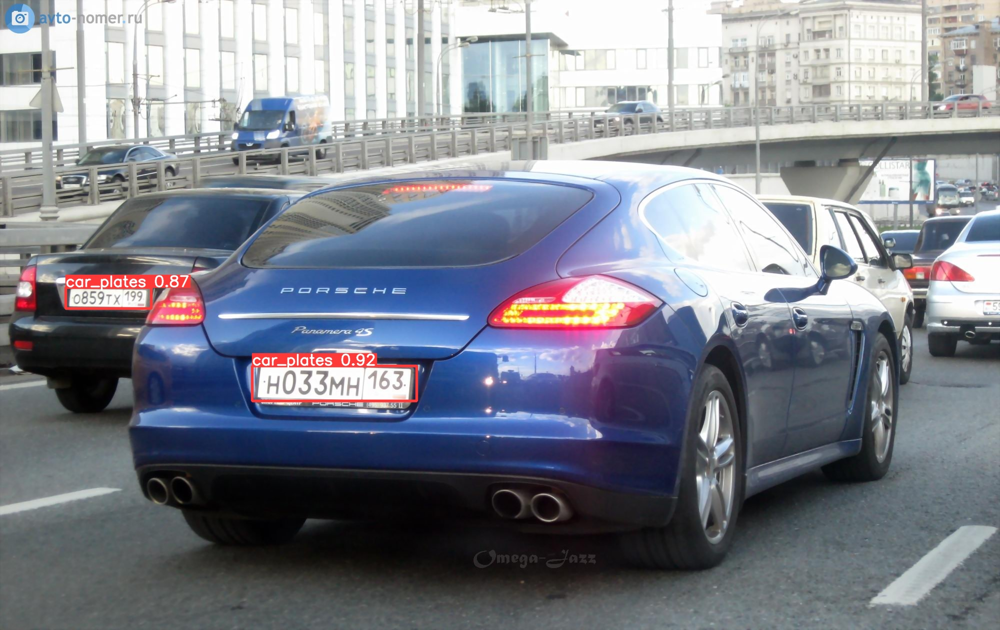

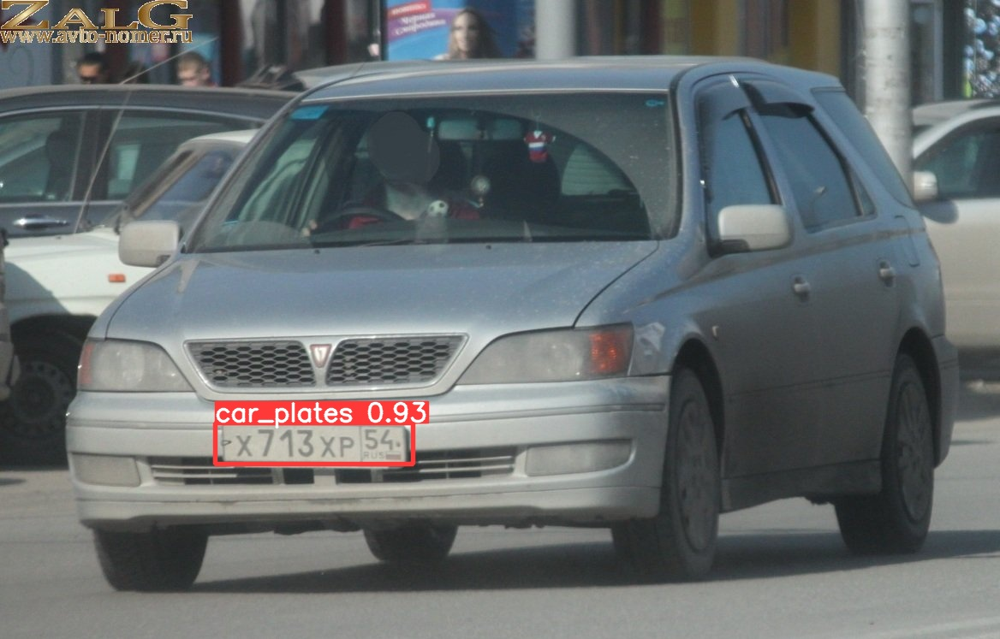

In [ ]:
for imageName in glob.glob('/content/drive/MyDrive/car_plates/exp4/show/*.jpg'):
    display(Image(filename=imageName))
    print("\n")

## Работа с easyOCR

In [ ]:
!pip install easyocr
import easyocr

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 2.9 MB 2.5 MB/s 
     |████████████████████████████████| 145 kB 73.6 MB/s 
     |████████████████████████████████| 619 kB 62.4 MB/s 
     |████████████████████████████████| 47.6 MB 98.1 MB/s 
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.6.0.66
    Uninstalling opencv-python-headless-4.6.0.66:
      Successfully uninstalled opencv-python-headless-4.6.0.66


In [ ]:
import re
import cv2
import torch
import numpy as np
from google.colab.patches import cv2_imshow

In [ ]:
model = torch.hub.load('/content/yolov5','custom', path='/content/drive/MyDrive/car_plates/exp/weights/best.pt', force_reload=True, source='local')

YOLOv5 🚀 v7.0-42-g5545ff3 Python-3.8.16 torch-1.13.0+cu116 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model summary: 157 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
Adding AutoShape... 


In [ ]:
reader = easyocr.Reader(['ru'])

def extract_number(img_filename, model, reader):
    image = cv2.imread(img_filename)
    img_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    result = model(img_gray)
    cordinates = result.xyxyn[0][:, :-1]
    width, height = image.shape[1], image.shape[0]

    for row in cordinates:
        x1, y1, x2, y2 = int(row[0]*width), int(row[1]*height), int(row[2]*width), int(row[3]*height)
        read = reader.readtext(img_gray[y1:y2, x1:x2])
        print(read[0][-2].upper().replace(';', ''))

        cv2.rectangle(image, (x1, y1), (x2, y2), (0, 255, 0), 2)
        cv2.rectangle(image, (x1, y1-28),  (x2, y1), (51, 51, 255) , -1)
        plate = ''.join(re.findall(r'[0-9, А, В, Е, К, М, Н, О, Р, С, Т, У, Х]', read[0][-2].upper()))
        cv2.putText(image, ' ' + plate, (x1, y1 - 10), cv2.FONT_HERSHEY_COMPLEX, 0.55, (255, 255, 255), 2)

    cv2_imshow(image)

~Т477РУЙ197


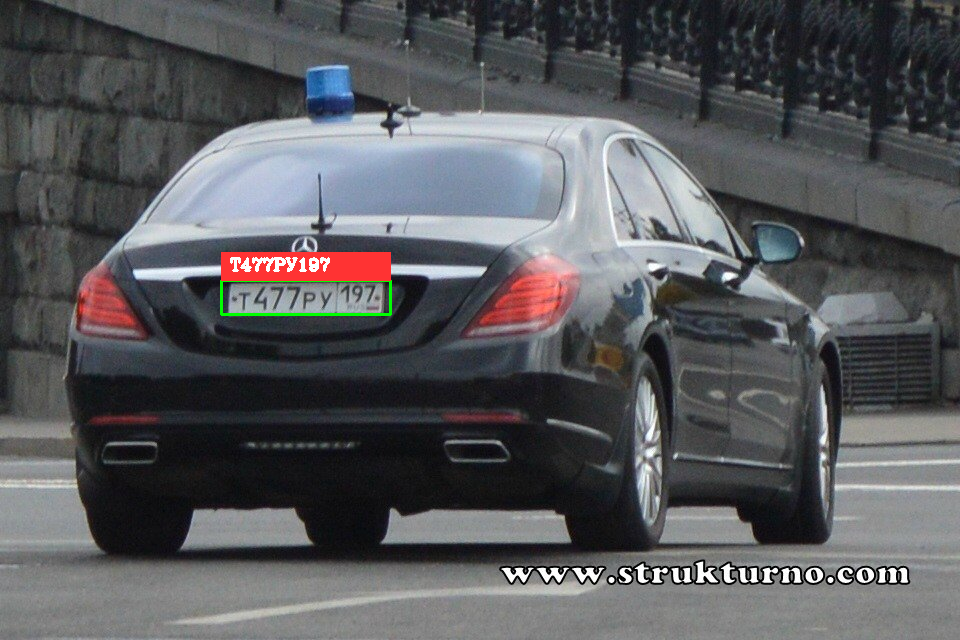

In [ ]:
extract_number('/content/data/test/images/10.jpg', model, reader)